<a href="https://colab.research.google.com/github/madztheo/sorting-hat-ai/blob/main/Demo_of_node_embedding_using_GCN_for_wallet_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import warnings; warnings.filterwarnings('ignore')
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.animation as animation
from IPython.display import HTML
from sklearn.preprocessing import OneHotEncoder
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()

Instructions for updating:
non-resource variables are not supported in the long term


In [ ]:
# Mount GDrive
from google.colab import drive
drive.mount('/content/drive')
%cd "/content/drive/MyDrive/Colab Notebooks/"

# Set addy name
addy = 'bighairymonster'

# Read the CSV file
data = np.genfromtxt(f'wallet_partial_data_{addy}.csv', delimiter=',', dtype=str, skip_header=True)

# Create an empty graph
W = nx.Graph()
nodes_map = {}
map_nodes = {}
neighbours_l1 = []
current_index = 0
#Save original node
original_node = data[0][0]
# Add edges to the graph
for row in data:
  source = row[0]
  target = row[1]
  if not source in nodes_map:
    nodes_map[source] = current_index
    map_nodes[current_index] = source
    current_index += 1
  if not target in nodes_map:
    nodes_map[target] = current_index
    map_nodes[current_index] = source
    current_index += 1
  if source == original_node:
    neighbours_l1.append(nodes_map[target])
  elif target == original_node:
    neighbours_l1.append(nodes_map[source])
  W.add_edge(nodes_map[source], nodes_map[target])
original_node = list(W)[0]
print(f"The network has {W.number_of_nodes()} nodes and {W.number_of_edges()} edges.")
# W.nodes(data=True)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/MyDrive/Colab Notebooks
The network has 447 nodes and 481 edges.


In [ ]:
# print([1 if w == list(W)[0] else 0 for w in W])
G = W

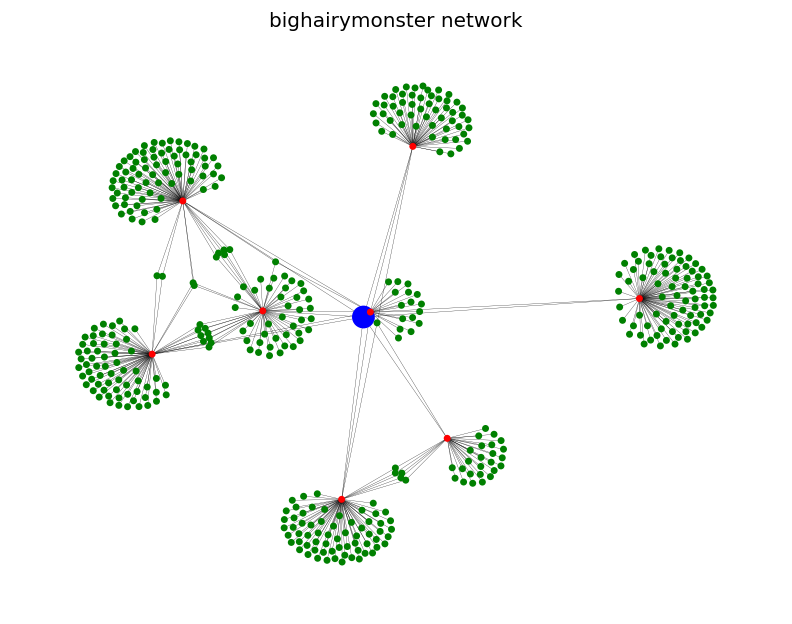

In [ ]:
plt.figure(dpi=120)
pos = nx.spring_layout(G)
node_color = ['b' if v == original_node else 'r' if v in neighbours_l1 else 'g' for v in G]
nx.draw(G, pos=pos, with_labels=False, node_color=node_color, width=0.16, node_size=[160 if v == original_node else 10 for v in G])
plt.title(f'{addy} network')
plt.show()

In [ ]:
# order the data
order = sorted(list(G.nodes()))

# Create an adjacency matrix from the data
A = nx.to_numpy_array(G, nodelist= order) 
A = np.matrix(A)

# Create an identity matrix from the data
I = np.eye(*A.shape)

# Add a self-loop to each node
A_tilde = A.copy() + I

# Create the diagonal node-degree matrix of A_tilde
D_hat = np.array(np.sum(A_tilde, axis=0))[0]

# Apply symmetric normalization
D_inv = np.matrix(np.diag(D_hat**(-0.5)))
A_hat = D_inv * A_tilde * D_inv

# define feature matrix 
X = I 

### **Non-supervized node embedding with random weights**

---



---



In [ ]:
# Weights initialization
n_input = G.number_of_nodes()    # Input layer dimension
n_hidden = 4    # Hidden layer dimension
n_embedding = 2 # Node embedding dimension

np.random.seed(123)

# Input to hidden weights
W_1 = np.random.normal(loc=0, scale=1, size=(n_input, n_hidden)) 

# Hidden to output weights
W_2 = np.random.normal(loc=0, size=(n_hidden, n_embedding))

In [ ]:
# Define a GCN layer, include the ReLU Activation function
def relu(x):
    return np.maximum(x, 0, x)
    
def gcn_layer(A_hat, X, W):
    return relu(A_hat * X * W)

In [ ]:
# Stack the GCN layers
H_1 = gcn_layer(A_hat, X, W_1)
H_2 = gcn_layer(A_hat, H_1, W_2)
output = H_2

print('Output shape:', output.shape)

Output shape: (447, 2)


In [ ]:
# def reject_outliers(matrix2cols, m = 2.):
#     col1 = [x.item(0) for x in matrix2cols[:, 0]]
#     col2 = [x.item(0) for x in matrix2cols[:, 1]]
#     d1 = np.abs(col1 - np.median(col1))
#     d2 = np.abs(col1 - np.median(col1))
#     mdev1 = np.median(d1)
#     mdev2 = np.median(d2)
#     s1 = d1/mdev1 if mdev1 else np.zero(len(d1))
#     s2 = d2/mdev2 if mdev2 else np.zero(len(d2))
#     mask = (s1 < m) & (s2 < m)
#     return matrix2cols[mask]
# trim_output = reject_outliers(output)    
# output = trim_output

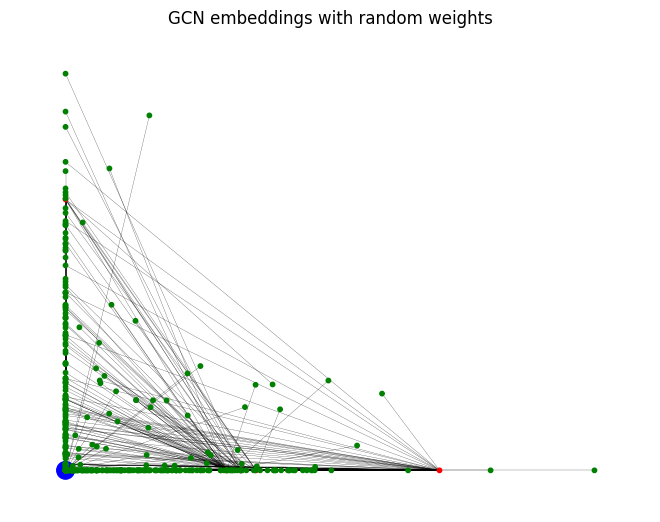

In [ ]:
plt.figure(dpi=100)
# Extract the feature representations
feature_representations = {node: np.array(output)[node] for node in G.nodes()}
# Plot the embeddings
nx.draw(G, pos= feature_representations, with_labels=False, node_color=node_color, width=0.16, node_size=[160 if v == original_node else 10 for v in G])
plt.title('GCN embeddings with random weights')
plt.show()

### **Semi-supervised Node Classification**

---



---



In [ ]:
# These functions are from tkipf/gcn 

def masked_softmax_cross_entropy(preds, labels, mask):
    """Softmax cross-entropy loss with masking."""
    loss = tf.nn.softmax_cross_entropy_with_logits_v2(logits=preds, labels=labels)
    mask = tf.cast(mask, dtype=tf.float32)
    mask /= tf.reduce_mean(mask)
    loss *= mask
    return tf.reduce_mean(loss)

def masked_accuracy(preds, labels, mask):
    """Accuracy with masking."""
    correct_prediction = tf.equal(tf.argmax(preds, 1), tf.argmax(labels, 1))
    accuracy_all = tf.cast(correct_prediction, tf.float32)
    mask = tf.cast(mask, dtype=tf.float32)
    mask /= tf.reduce_mean(mask)
    accuracy_all *= mask
    return tf.reduce_mean(accuracy_all)

[<tf.Variable 'W_1:0' shape=(447, 4) dtype=float32_ref>, <tf.Variable 'W_2:0' shape=(4, 2) dtype=float32_ref>]
W_1:0
<class 'numpy.ndarray'>
[[ 0.60145867 -0.48020878 -1.0466334   0.47345963]
 [-0.3241048   0.6020252   0.46823382  0.11542509]
 [ 0.5516454  -1.236871   -0.3158531  -0.49305165]
 ...
 [-0.28879926  0.3497488  -0.22926112  0.14857602]
 [-0.8850505  -0.21567447 -2.523084    0.91388357]
 [ 0.02665711 -0.7966481   1.2517519  -0.03525539]]
W_2:0
[[-0.28143504  0.15665059]
 [-0.06293576 -0.05161453]
 [ 0.13516954 -0.2769319 ]
 [ 0.13594031  0.08484951]]


Text(0, 0.5, 'Accuracy')

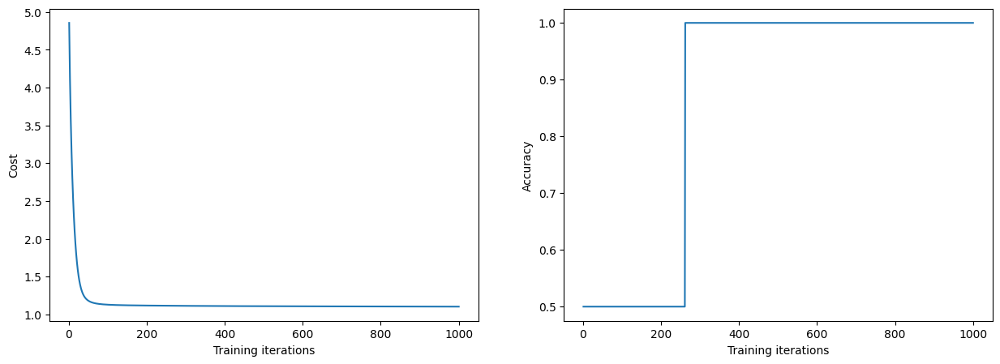

In [ ]:
A_Hat = tf.constant(A_hat, 'float')
# ---------------------------------------------------------------- 
X_train = I

node_labels = [2 if v == original_node else 2 if v in neighbours_l1 else 1 for v in G]
y_train = np.array(node_labels)
Y_train = OneHotEncoder(categories='auto').fit_transform(y_train.reshape(-1, 1))
Y_train = Y_train.toarray()

X = tf.placeholder('float', [X_train.shape[0], X_train.shape[1]],name = 'X')  
Y = tf.placeholder('float', [Y_train.shape[0], Y_train.shape[1]],name = 'Y') 
mask = tf.placeholder('float', [X_train.shape[0]],name = 'Mask') 
# ---------------------------------------------------------------- 
# Trainable parameters
n_input = G.number_of_nodes()
n_hidden = 4
n_classes = 2

params = {
    # Input to hidden weights
    'W_1': tf.Variable(tf.random_normal([n_input, n_hidden], mean= 0, stddev= 1), name = 'W_1'),
    # Hidden to output weights
    'W_2': tf.Variable(tf.random_normal([n_hidden, n_classes], mean= 0, stddev= 1), name = 'W_2')
}
# ---------------------------------------------------------------- 
def GCN_supervised(X, params):
    layer_1 = tf.matmul(tf.matmul(A_Hat, X), params['W_1'])
    layer_1 = tf.nn.relu(layer_1, name = 'layer_1')  
    output = tf.matmul(tf.matmul(A_Hat, layer_1), params['W_2'], name = 'output_layer') 
    return output

Z = GCN_supervised(X, params)
Y_prob = tf.nn.softmax(Z, name = 'Y_prob')

mask_tr = np.zeros(G.number_of_nodes())
mask_tr[[0, G.number_of_nodes() - 1]] = 1
mask_tr = np.array(mask_tr, dtype=np.bool)

fro = tf.matmul(Z, tf.transpose(Z)) - A_Hat
reg = tf.sqrt(tf.reduce_sum(tf.square(fro)))

lambdaa = 0.04
cost = masked_softmax_cross_entropy(preds = Y_prob, labels = Y, mask = mask_tr) + lambdaa * reg
# ---------------------------------------------------------------- 
num_epochs = 1000
learning_rate = 0.04
optimizer = tf.train.GradientDescentOptimizer(learning_rate).minimize(cost) 

accuracy = masked_accuracy(preds = tf.round(Y_prob), labels = Y, mask = mask_tr)
# ----------------------------------------------------------------
# Global variables initializer 
init = tf.global_variables_initializer() 
# Starting the Tensorflow Session 
with tf.Session() as sess:       
    # Initializing the variables 
    init.run()  

    cost_history = []
    accuracy_history = [] 
    embeddings = []
    for epoch in range(num_epochs):    
        # Running the optimizer 
        sess.run(optimizer, feed_dict={X: X_train, Y: Y_train, mask: mask_tr}) 
                 
        # Calculating & storing cost, accuracy and embeddings on current epoch 
        c, acc, z = sess.run([cost, accuracy, Z], feed_dict = {X: X_train, Y: Y_train, mask: mask_tr}) 
        cost_history.append(c) 
        accuracy_history.append(acc)
        embeddings.append(z)
    print(tf.trainable_variables())
    var = [v for v in tf.trainable_variables() if v.name == "W_1:0"][0]
    print(var.name)
    lastW1 = sess.run(var)
    print(type(lastW1))
    print(lastW1)
    var = [v for v in tf.trainable_variables() if v.name == "W_2:0"][0]
    print(var.name)
    lastW2 = sess.run(var)
    print(lastW2)
tf.reset_default_graph()        
# ----------------------------------------------------------------
plt.figure(figsize=(15, 5))
plt.subplot(1,2,1)
plt.plot(np.arange(1, len(cost_history)+1), cost_history) 
plt.xlabel('Training iterations')
plt.ylabel('Cost')

plt.subplot(1,2,2)
plt.plot(np.arange(1, len(accuracy_history)+1), accuracy_history) 
plt.xlabel('Training iterations')
plt.ylabel('Accuracy')

In [ ]:
fig= plt.figure(dpi=150)
ax = fig.subplots()

def draw_embeddings(i):
    output = embeddings[i]
    feature_representations = {node: np.array(output)[node] for node in G.nodes()}
    
    ax.cla()
    ax.axis('off')
    ax.set_title(f'Wallet "{addy}": node embeddings for epoch: %d' % i)    
    nx.draw_networkx(G, pos= feature_representations, node_color=node_color,
            with_labels=False, ax=ax, width=0.16, node_size=[300 if v == original_node else 25 for v in G])
    plt.close()
plt.close()

In [ ]:
anim = animation.FuncAnimation(fig, draw_embeddings, frames=len(embeddings), interval=20)
HTML(anim.to_html5_video())

In [ ]:
import json
import pickle
print(lastW2)
print(2*lastW2)
model1 = [lastW1, lastW2]
model2 = [lastW1, 2*lastW2]
bytes1 = json.dumps({"W1": pickle.dumps(model1[0]).decode('latin-1'), "W2": pickle.dumps(model1[1]).decode('latin-1')})
bytes2 = json.dumps({"W1": pickle.dumps(model2[0]).decode('latin-1'), "W2": pickle.dumps(model2[1]).decode('latin-1')})
print(bytes1)
data_array = [bytes1, bytes2]
# deserialized_from_json = pickle.loads(json.loads(serialized_as_json).encode('latin-1'))
W1 = np.vstack([pickle.loads(json.loads(data)["W1"].encode('latin-1')) for data in data_array])
print(W1)
W2 = np.mean([pickle.loads(json.loads(data)["W2"].encode('latin-1')) for data in data_array], axis=0)
print(W2)

[[-0.28143504  0.15665059]
 [-0.06293576 -0.05161453]
 [ 0.13516954 -0.2769319 ]
 [ 0.13594031  0.08484951]]
[[-0.5628701   0.31330118]
 [-0.12587152 -0.10322905]
 [ 0.27033907 -0.5538638 ]
 [ 0.27188063  0.16969901]]
{"W1": "\u0080\u0004\u0095~\u001c\u0000\u0000\u0000\u0000\u0000\u0000\u008c\u0015numpy.core.multiarray\u0094\u008c\f_reconstruct\u0094\u0093\u0094\u008c\u0005numpy\u0094\u008c\u0007ndarray\u0094\u0093\u0094K\u0000\u0085\u0094C\u0001b\u0094\u0087\u0094R\u0094(K\u0001M\u00bf\u0001K\u0004\u0086\u0094h\u0003\u008c\u0005dtype\u0094\u0093\u0094\u008c\u0002f4\u0094\u0089\u0088\u0087\u0094R\u0094(K\u0003\u008c\u0001<\u0094NNNJ\u00ff\u00ff\u00ff\u00ffJ\u00ff\u00ff\u00ff\u00ffK\u0000t\u0094b\u0089B\u00f0\u001b\u0000\u00002\u00f9\u0019?\u00ed\u00dd\u00f5\u00be\u0015\u00f8\u0085\u00bfMi\u00f2>\u0010\u00f1\u00a5\u00beS\u001e\u001a?X\u00bc\u00ef>\u00fec\u00ec=\u00a28\r?\u00caQ\u009e\u00bf\u007f\u00b7\u00a1\u00beDq\u00fc\u00be\u00bbnz?\u00cb\u0096\u0090\u00bf4\u0083\u00c6\u00bd\u00f5\u0

In [ ]:
bytes1 = json.dumps({
    "W1": pickle.dumps(model1[0]).decode('latin-1'),
    "W2": pickle.dumps(model1[1]).decode('latin-1')
    })